In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch
from torch.utils.data import Dataset
import albumentations as A
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
import cv2 

In [2]:
dataset_path="/kaggle/working/dataset_train/ash_color"

train_df = pd.read_csv(f"{dataset_path}/train_df.csv")
valid_df = pd.read_csv(f"{dataset_path}/validation_df.csv")

valid_aug_list = [
    ToTensorV2(transpose_mask=True),
]

In [3]:
class fastnumpyio:
    def load(file):
        file = open(file, "rb")
        header = file.read(128)
        descr = str(header[19:25], 'utf-8').replace("'", "").replace(" ", "")
        shape = tuple(int(num) for num in str(header[60:120], 'utf-8').replace(', }', '').replace('(', '').replace(')', '').split(','))
        datasize = np.lib.format.descr_to_dtype(descr).itemsize
        for dimension in shape:
            datasize *= dimension
        return np.ndarray(shape, dtype=descr, buffer=file.read(datasize))
    
def preprocess_image(image):
    image[:,:,0]=np.clip(image[:,:,0],a_min=0,a_max=0.66)*1.5
    return image

class ContrailsDataset(Dataset):
    def __init__(self, df, transform, mode='train'):
        self.df = df
        self.transform = A.Compose(transform)
        self.mode = mode

    def __getitem__(self, index):
        row = self.df.iloc[index]
        path = row.path
        record_id = row.record_id
        npy = fastnumpyio.load(str(path)).astype("float32")

        if self.mode == 'train':
            image = npy[..., :-1]
            label = npy[..., -1]
            image = preprocess_image(image)
            data = self.transform(image=image, mask=label)
            image = data['image']
            label = data['mask']
            label = np.expand_dims(label, 0)
            image = torch.tensor(image)
            label = torch.tensor(label)
            return image.float(), label.float()

        if self.mode == 'test':
            image = npy
            data = self.transform(image=image)
            image = data['image']
            image = torch.tensor(image)
            return image.float(), record_id

    def __len__(self):
        return len(self.df)
    
dataset_train = ContrailsDataset(train_df, valid_aug_list)

/tmp/ipykernel_6792/1052020998.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image)
/tmp/ipykernel_6792/1668381892.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 3, figsize=(15, 4.5))


KeyboardInterrupt: 

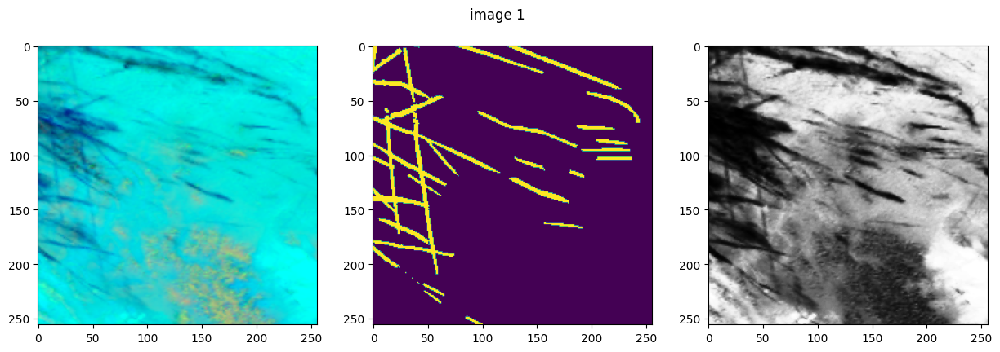

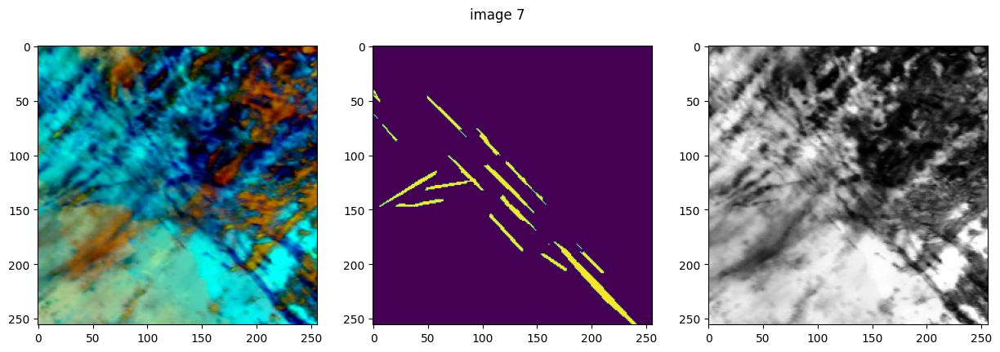

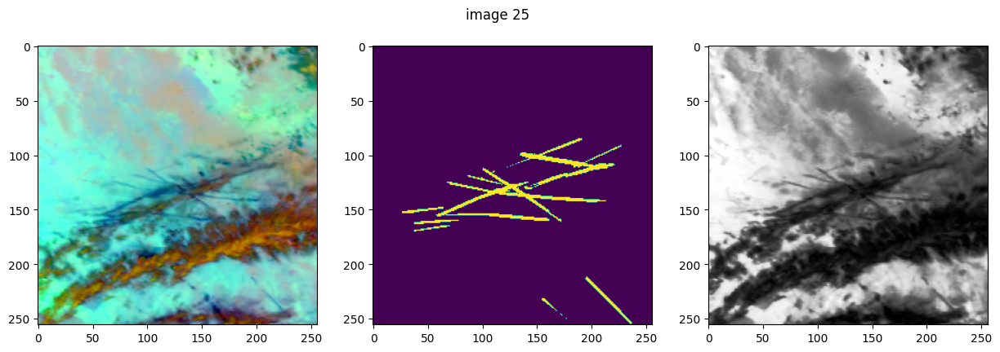

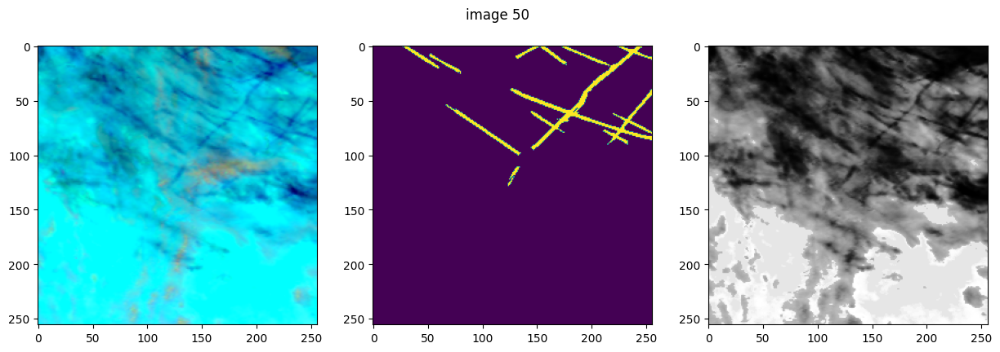

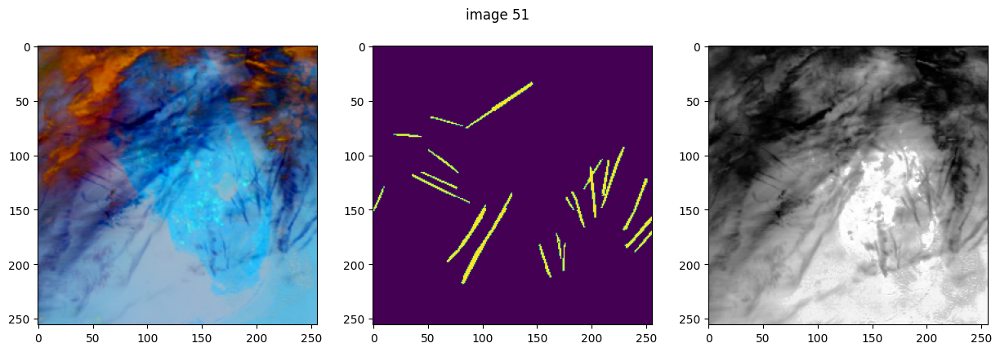

...

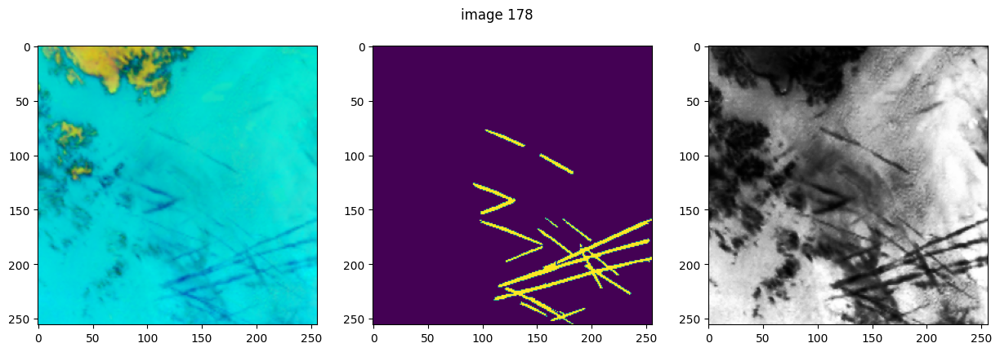

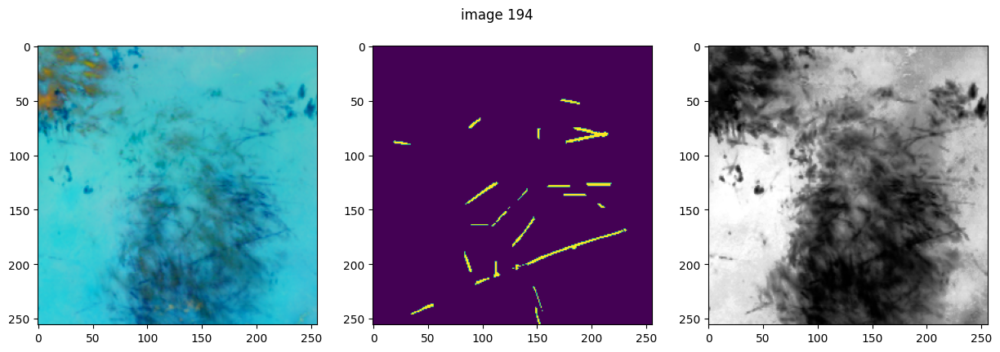

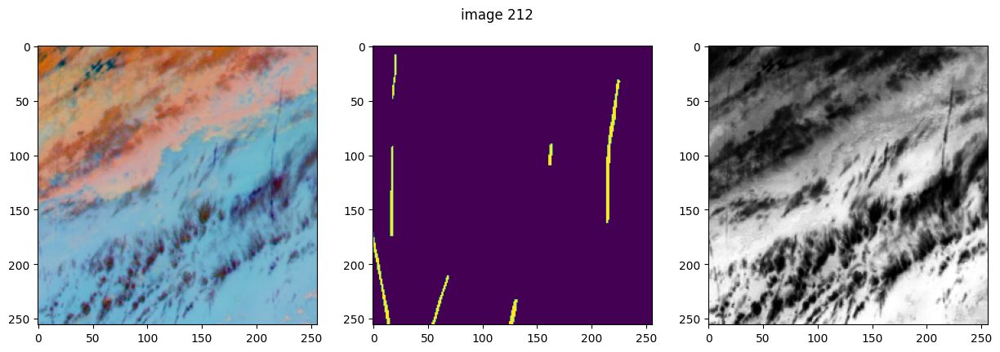

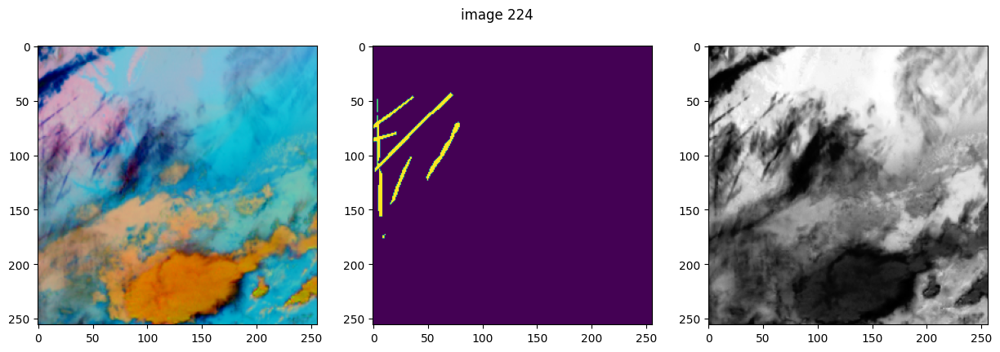

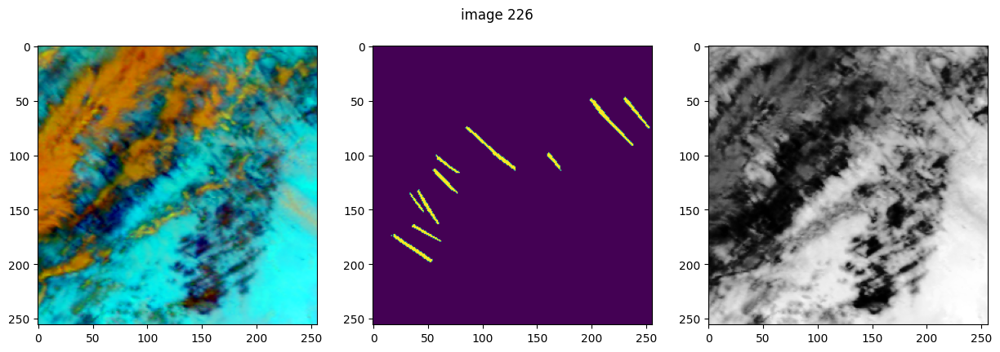

In [4]:
for i in range(len(dataset_train)):
    if i >500:continue
    image = dataset_train[i][0].numpy().transpose(1, 2, 0)
    label = dataset_train[i][1].numpy().transpose(1, 2, 0)
    if label.sum() > 1000:
        image_gray = (cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)*255).astype("uint8")
        hist_img = cv2.equalizeHist(image_gray)
        fig, ax = plt.subplots(1, 3, figsize=(15, 4.5))
        fig.suptitle(f"image {i}")
        ax[0].imshow(image)
        ax[1].imshow(label)
        ax[2].imshow(hist_img, cmap='gray')

In [27]:
image0_list = []
image1_list = []
image2_list = []
label_list = []
for id in tqdm(range(2500)):
    image = dataset_train[id][0].numpy()
    image0 = list(image[0, :, :].flatten())
    image1 = list(image[1, :, :].flatten())
    image2 = list(image[2, :, :].flatten())
    
    image0_list.append(image0)
    image1_list.append(image1)
    image2_list.append(image2)

    label = list(dataset_train[id][1].numpy().flatten())
    label_list.append(label)

image0_list = np.dstack(image0_list).flatten()
image1_list = np.dstack(image1_list).flatten()
image2_list = np.dstack(image2_list).flatten()
label_list = np.dstack(label_list).flatten()
    
image0_labeled_list = image0_list[label_list == 1]
image1_labeled_list = image1_list[label_list == 1]
image2_labeled_list = image2_list[label_list == 1]


  0%|          | 0/2500 [00:00<?, ?it/s]/tmp/ipykernel_19865/1052020998.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image)
 93%|█████████▎| 2331/2500 [02:19<00:09, 17.17it/s]

: 

: 

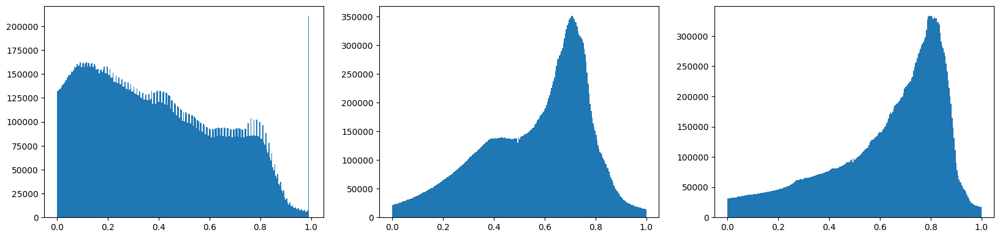

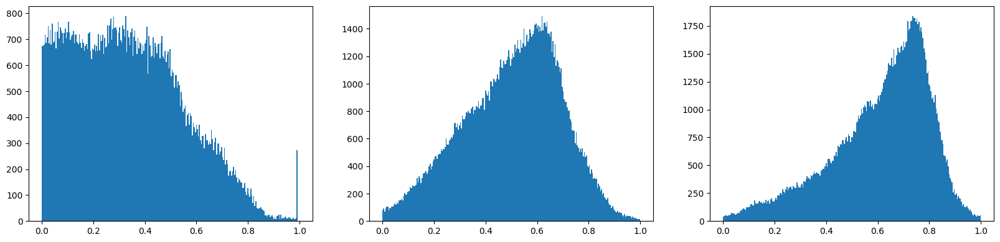

In [26]:
fig, ax = plt.subplots(1, 3, figsize=(20, 4.5))
ax[0].hist(image0_list, bins=256,range=(0+1e-6, 1-1e-6));
ax[1].hist(image1_list, bins=256,range=(0+1e-6, 1-1e-6));
ax[2].hist(image2_list, bins=256,range=(0+1e-6, 1-1e-6));

fig, ax = plt.subplots(1, 3, figsize=(20, 4.5))
ax[0].hist(image0_labeled_list, bins=256,range=(0+1e-6, 1-1e-6));
ax[1].hist(image1_labeled_list, bins=256,range=(0+1e-6, 1-1e-6));
ax[2].hist(image2_labeled_list, bins=256,range=(0+1e-6, 1-1e-6));

  0%|          | 0/500 [00:00<?, ?it/s]/tmp/ipykernel_23345/1052020998.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image)
100%|██████████| 500/500 [00:24<00:00, 20.12it/s]


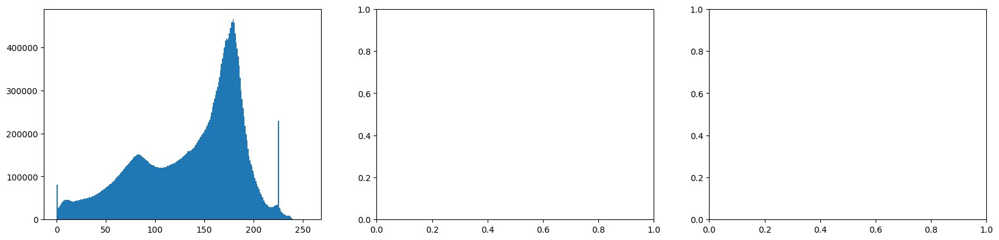

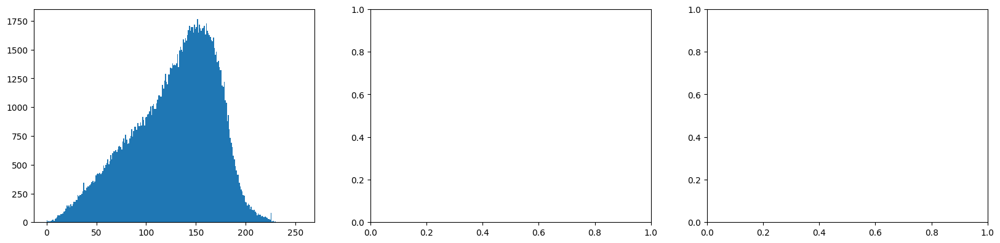

In [20]:
image0_array = np.array([])
label_array = np.array([])
for id in tqdm(range(500)):
    image = dataset_train[id][0].numpy().transpose(1, 2, 0)
    image_gray = (cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)*255).astype("uint8").flatten()
    image0_array = np.concatenate((image0_array, image_gray), axis=0)

    label = dataset_train[id][1].numpy().flatten()
    label_array = np.concatenate((label_array, label), axis=0)
    # break
    
image0_labeled_array = image0_array[label_array == 1]

fig, ax = plt.subplots(1, 1, figsize=(8, 4.5))
ax[0].hist(image0_array, bins=256,range=(0, 256));
fig, ax = plt.subplots(1, 1, figsize=(8, 4.5))
ax[0].hist(image0_labeled_array, bins=256,range=(0, 256));

In [29]:
import os
id_list=os.listdir("/kaggle/input/google-research-identify-contrails-reduce-global-warming/train")


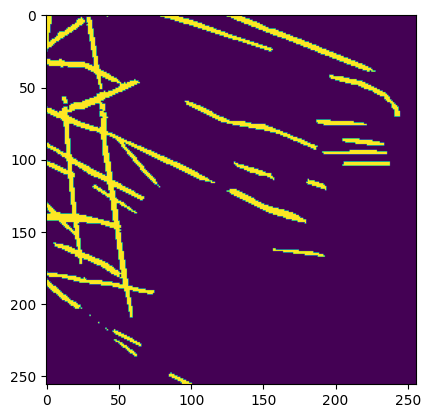

In [34]:
id=id_list[1]
mask=np.load(f"/kaggle/input/google-research-identify-contrails-reduce-global-warming/train/{id}/human_pixel_masks.npy")
plt.imshow(mask)

In [50]:
#band11,14,15
band08=np.load(f"/kaggle/input/google-research-identify-contrails-reduce-global-warming/train/{id}/band_08.npy")[:,:,4]
band09=np.load(f"/kaggle/input/google-research-identify-contrails-reduce-global-warming/train/{id}/band_09.npy")[:,:,4]
band10=np.load(f"/kaggle/input/google-research-identify-contrails-reduce-global-warming/train/{id}/band_10.npy")[:,:,4]
band11=np.load(f"/kaggle/input/google-research-identify-contrails-reduce-global-warming/train/{id}/band_11.npy")[:,:,4]
band12=np.load(f"/kaggle/input/google-research-identify-contrails-reduce-global-warming/train/{id}/band_12.npy")[:,:,4]
band13=np.load(f"/kaggle/input/google-research-identify-contrails-reduce-global-warming/train/{id}/band_13.npy")[:,:,4]
band14=np.load(f"/kaggle/input/google-research-identify-contrails-reduce-global-warming/train/{id}/band_14.npy")[:,:,4]
band15=np.load(f"/kaggle/input/google-research-identify-contrails-reduce-global-warming/train/{id}/band_15.npy")[:,:,4]
band16=np.load(f"/kaggle/input/google-research-identify-contrails-reduce-global-warming/train/{id}/band_16.npy")[:,:,4]

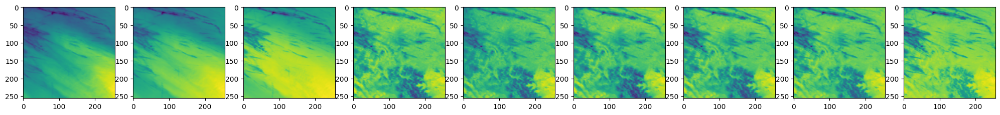

In [52]:
fig,ax=plt.subplots(1,9,figsize=(25,5))
ax[0].imshow(band08)
ax[1].imshow(band09)
ax[2].imshow(band10)
ax[3].imshow(band11)
ax[4].imshow(band12)
ax[5].imshow(band13)
ax[6].imshow(band14)
ax[7].imshow(band15)
ax[8].imshow(band16)

(array([2.2000e+01, 9.4000e+01, 3.9300e+02, 9.9600e+02, 1.9300e+03,
        3.7980e+03, 7.8400e+03, 2.3779e+04, 2.3494e+04, 3.1900e+03]),
 array([245.21876526, 248.10494995, 250.99111938, 253.87728882,
        256.76348877, 259.6496582 , 262.53582764, 265.42199707,
        268.3081665 , 271.19436646, 274.08053589]),
 <BarContainer object of 10 artists>)

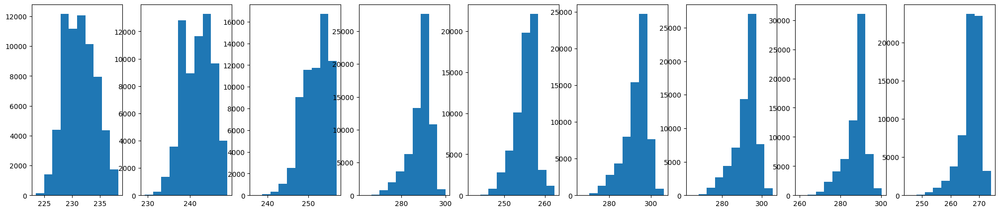

In [53]:
fig,ax=plt.subplots(1,9,figsize=(25,5))
ax[0].hist(band08.flatten())
ax[1].hist(band09.flatten())
ax[2].hist(band10.flatten())
ax[3].hist(band11.flatten())
ax[4].hist(band12.flatten())
ax[5].hist(band13.flatten())
ax[6].hist(band14.flatten())
ax[7].hist(band15.flatten())
ax[8].hist(band16.flatten())